In [1]:
import Pkg; Pkg.add("ITensors")

   Resolving package versions...
     Project No packages added to or removed from `C:\Users\AVM11\.julia\environments\v1.12\Project.toml`
    Manifest No packages added to or removed from `C:\Users\AVM11\.julia\environments\v1.12\Manifest.toml`


In [2]:
using DelimitedFiles
using Pkg
Pkg.activate("../")  # Activate the main project
using Dleto
using Random
using ITensors
using Statistics
using Plots
using Combinatorics

  Activating project at `c:\Users\AVM11\GitHub\OpenDleto`


WebIO._IJuliaInit()

Loading Dleto Plots Extension


In [3]:
function random_tensor_stratification(k::Int; seed::Union{Int,Nothing}=nothing)
    # Set random seed if provided
    if seed !== nothing
        Random.seed!(seed)
        println("Random seed set to $seed")
    end

    # Create ITensor indices
    i = Index(k, "node1_rand")
    j = Index(k, "node2_rand")
    kidx = Index(k, "node3_rand")
    RandTensor = ITensor(Float32, i, j, kidx)

    # Fill tensor with random values from Uniform(-1, 1)
    for a in 1:k, b in 1:k, c in 1:k
        RandTensor[i=>a, j=>b, kidx=>c] = rand(Float32) * 2 - 1
    end

    # Analyze tensor
    T_array = Array(RandTensor, i, j, kidx)
    println("Random tensor statistics:")
    println("  Min value: $(minimum(T_array))")
    println("  Max value: $(maximum(T_array))")
    println("  Mean value: $(mean(T_array))")

    # Stratify tensor
    println("\n🔬 Performing stratified decomposition on random tensor...")
    @time RandTensor_strat, Xs_strat_rand = stratify(RandTensor)
    println("✅ Random tensor stratification complete!")

    # Plot original and stratified tensors
    p1 = plot_tensor(RandTensor; title="Original Random Tensor", color=:blue)
    p2 = plot_tensor(RandTensor_strat; title="Stratified Random Tensor", color=:red)
    Plots.plot(p1, p2; layout=(1,2), size=(800,400))
end

random_tensor_stratification (generic function with 1 method)

Random tensor statistics:
  Min value: -0.9999677
  Max value: 0.99999094
  Mean value: 1.6866685e-5

🔬 Performing stratified decomposition on random tensor...
Using SVDSolver...
Converting LinearMap to Matrix for SVD...


[ Info: Found 2 derivations for stratification.


 11.043813 seconds (50.67 M allocations: 3.766 GiB, 4.94% gc time, 88.68% compilation time: 3% of which was recompilation)
✅ Random tensor stratification complete!


┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt c:\Users\AVM11\GitHub\OpenDleto\ext\DletoPlotsExt.jl:257
┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt c:\Users\AVM11\GitHub\OpenDleto\ext\DletoPlotsExt.jl:257


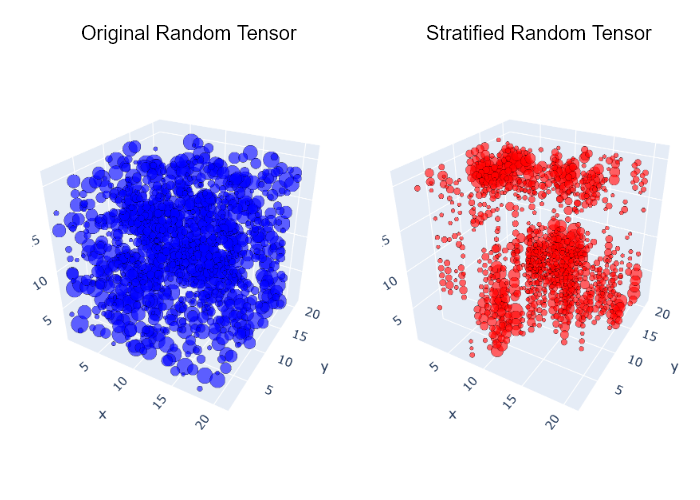

In [4]:
random_tensor_stratification(20)

Random tensor statistics:
  Min value: -0.99993575
  Max value: 0.9998834
  Mean value: 0.001613074

🔬 Performing stratified decomposition on random tensor...
Using SVDSolver...
Converting LinearMap to Matrix for SVD...
 11.387925 seconds (30.89 M allocations: 11.253 GiB, 15.28% gc time)
✅ Random tensor stratification complete!


[ Info: Found 2 derivations for stratification.
┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt c:\Users\AVM11\GitHub\OpenDleto\ext\DletoPlotsExt.jl:257
┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt c:\Users\AVM11\GitHub\OpenDleto\ext\DletoPlotsExt.jl:257


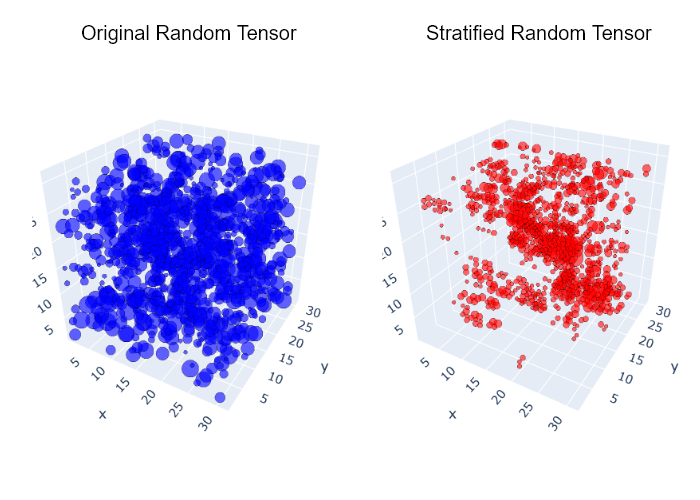

In [5]:
random_tensor_stratification(30)

Random tensor statistics:
  Min value: -0.99996245
  Max value: 0.9999949
  Mean value: 0.0019613453

🔬 Performing stratified decomposition on random tensor...
Using SVDSolver...
Converting LinearMap to Matrix for SVD...
 50.760039 seconds (95.23 M allocations: 44.900 GiB, 9.03% gc time)
✅ Random tensor stratification complete!


[ Info: Found 2 derivations for stratification.
┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt c:\Users\AVM11\GitHub\OpenDleto\ext\DletoPlotsExt.jl:257
┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt c:\Users\AVM11\GitHub\OpenDleto\ext\DletoPlotsExt.jl:257


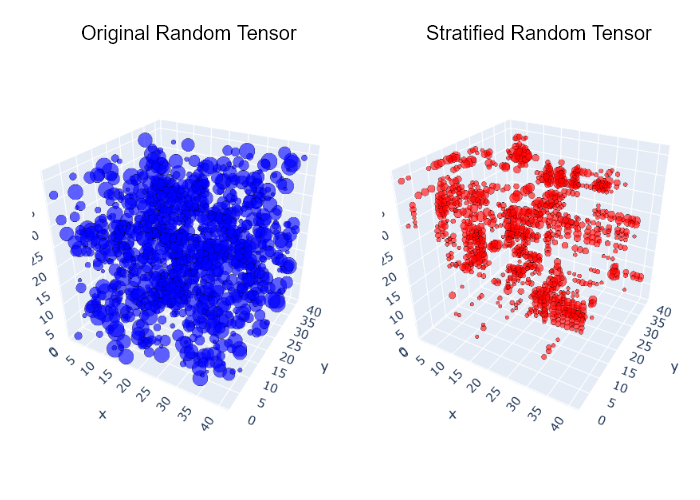

In [6]:
random_tensor_stratification(40)

Random tensor statistics:
  Min value: -0.9999943
  Max value: 0.99999213
  Mean value: 0.00085974555

🔬 Performing stratified decomposition on random tensor...
Using SVDSolver...
Converting LinearMap to Matrix for SVD...
162.042416 seconds (229.80 M allocations: 132.937 GiB, 5.31% gc time)
✅ Random tensor stratification complete!


[ Info: Found 2 derivations for stratification.
┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt c:\Users\AVM11\GitHub\OpenDleto\ext\DletoPlotsExt.jl:257
┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt c:\Users\AVM11\GitHub\OpenDleto\ext\DletoPlotsExt.jl:257


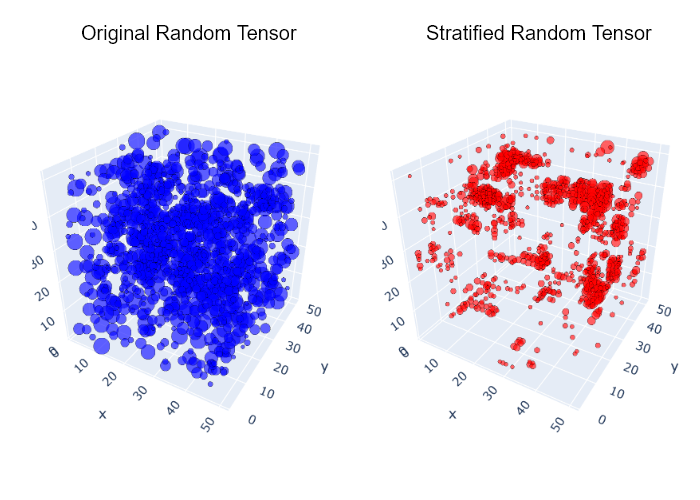

In [7]:
random_tensor_stratification(50)